# Title - VISUALIZING THE AIRBNB EXPERIENCE: INSIGHTS FROM DATA ANALYSIS

# DATA - 230 DATA VISUALIZATION FINAL PROJECT

# Group-5
# NIVEGNA LAGADAPATI
# PRAYAG NIKUL PURANI
# SOUJANYA SANKATHALA
# LEELA SAI RAHUL SURYADEVARA
# VENKATA SAI KRISHNA VELAMALA

In [1]:
import pandas as pd

In [2]:
data = pd.read_csv("reviews.csv")

In [3]:
data.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,4952,6560,2009-08-02,25672,Diane,Staying with Mei Lin and Ross at the Butterfly...
1,4952,8953,2009-09-04,27901,Michaela,I stayed with Mei Lin and Ross during a confer...
2,4952,13779,2009-10-16,33939,Mark,What a wonderful place to stay. Wonderful peop...
3,4952,19790,2009-12-10,55537,David,"Convenient & easy-going, which is what I needed."
4,4952,51096,2010-06-08,131240,SiNae,"Warm and friendly folks, very helpful! Very co..."


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219068 entries, 0 to 219067
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   listing_id     219068 non-null  int64 
 1   id             219068 non-null  int64 
 2   date           219068 non-null  object
 3   reviewer_id    219068 non-null  int64 
 4   reviewer_name  219067 non-null  object
 5   comments       219014 non-null  object
dtypes: int64(3), object(3)
memory usage: 10.0+ MB


# Libaries Path implementation 

In [5]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string

In [6]:
# Specify NLTK data directory
nltk.data.path.append('C:/Users/Prayag Purani/Desktop/DV DATA 230/Projects/nltk_data')

nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw')
nltk.download('vader_lexicon')

[nltk_data] Downloading package omw-1.4 to C:\Users\Prayag
[nltk_data]     Purani\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to C:\Users\Prayag
[nltk_data]     Purani\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Prayag
[nltk_data]     Purani\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Prayag
[nltk_data]     Purani\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw to C:\Users\Prayag
[nltk_data]     Purani\AppData\Roaming\nltk_data...
[nltk_data]   Package omw is already up-to-date!
[nltk_data] Downloading package vader_lexicon to C:\Users\Prayag
[nltk_data]     Purani\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [7]:
import nltk

# Set the NLTK data directory (replace '/path/to/nltk_data' with the actual path)
nltk.data.path.append('C:/Users/Prayag Purani/Desktop/DV DATA 230/Projects/nltk_data')


In [8]:
def preprocess_text(text):
    tokens = word_tokenize(text.lower())
    
    stop_words = set(stopwords.words('english') + list(string.punctuation))
    filtered_tokens = [token for token in tokens if token not in stop_words]
    
    lemmatizer = WordNetLemmatizer()
    lemmas = [lemmatizer.lemmatize(token) for token in filtered_tokens]
    
    return lemmas

In [9]:
clean_reviews=[]
for i in range(len(data["comments"])):
    clean_reviews.append(preprocess_text(str(data['comments'].loc[i])))

In [10]:
clean_reviews

[['staying',
  'mei',
  'lin',
  'ross',
  'butterfly',
  'inn',
  'delightful',
  'house',
  'lovely',
  'natural',
  'light',
  'skylight',
  'wonderfully',
  'warm',
  'welcoming',
  'place',
  'mei',
  'lin',
  'especially',
  'kind',
  'loving',
  'four-year-old',
  'particularly',
  'loved',
  'helping',
  'feed',
  'bunny',
  'greatly',
  'appreciated',
  'location',
  'perfect',
  'near',
  'everything',
  'could',
  'walk',
  'many',
  'place',
  'including',
  'university',
  'downtown',
  'farmer',
  "'s",
  'market',
  'whole',
  'food',
  'pool',
  'mei',
  'lin',
  'even',
  'walked',
  'u',
  'show',
  'u',
  '``',
  'hp',
  'garage',
  "''",
  'way',
  'farmer',
  "'s",
  'market',
  'also',
  'great',
  'able',
  'use',
  'kitchen',
  'thank',
  'mei',
  'lin',
  'ross',
  'everything'],
 ['stayed',
  'mei',
  'lin',
  'ross',
  'conference',
  'attended',
  'stanford',
  'university',
  'warm',
  'welcome',
  'kindness',
  'made',
  'pleasent',
  'stay',
  'house',
  

In [11]:
for i in range(len(clean_reviews)):
    clean_reviews[i]=" ".join(clean_reviews[i])

In [12]:
clean_reviews

["staying mei lin ross butterfly inn delightful house lovely natural light skylight wonderfully warm welcoming place mei lin especially kind loving four-year-old particularly loved helping feed bunny greatly appreciated location perfect near everything could walk many place including university downtown farmer 's market whole food pool mei lin even walked u show u `` hp garage '' way farmer 's market also great able use kitchen thank mei lin ross everything",
 "stayed mei lin ross conference attended stanford university warm welcome kindness made pleasent stay house helped lot allowed use kitchen internet rent one bike house close campus downtown palo alto caltrain station convinient since n't car br/ thank much everything mei lin ross",
 'wonderful place stay wonderful people including fun conversation englebart future history digital culture great location everyone else said leafy small town neighborhood super close stanford caltrain downtown palo alto would definitely stay',
 'conve

In [13]:
import re

def remove_special_characters(text):
    # Replace special characters with an empty string
    clean_text = re.sub(r"[^a-zA-Z0-9\s]", "", text)
    return clean_text


In [14]:
for i in range(len(clean_reviews)):
    clean_reviews[i] = remove_special_characters(clean_reviews[i])

clean_reviews

['staying mei lin ross butterfly inn delightful house lovely natural light skylight wonderfully warm welcoming place mei lin especially kind loving fouryearold particularly loved helping feed bunny greatly appreciated location perfect near everything could walk many place including university downtown farmer s market whole food pool mei lin even walked u show u  hp garage  way farmer s market also great able use kitchen thank mei lin ross everything',
 'stayed mei lin ross conference attended stanford university warm welcome kindness made pleasent stay house helped lot allowed use kitchen internet rent one bike house close campus downtown palo alto caltrain station convinient since nt car br thank much everything mei lin ross',
 'wonderful place stay wonderful people including fun conversation englebart future history digital culture great location everyone else said leafy small town neighborhood super close stanford caltrain downtown palo alto would definitely stay',
 'convenient easy

In [15]:
from nltk.sentiment import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()

def get_sentiment_score(text):
    return sid.polarity_scores(text)['compound']



In [16]:
input_text="staying mei lin ross butterfly inn delightful house lovely natural light skylight wonderfully warm welcoming place mei lin especially kind loving fouryearold particularly loved helping feed bunny greatly appreciated location perfect near everything could walk many place including university downtown farmer s market whole food pool mei lin even walked u show u  hp garage  way farmer s market also great able use kitchen thank mei lin ross everything"

In [17]:
sentiment_score=[]

In [18]:
for i in range(len(clean_reviews)):
    sentiment_score.append(get_sentiment_score(clean_reviews[i]))

In [20]:
sentiment_score

[0.9934,
 0.8555,
 0.9698,
 0.3182,
 0.926,
 0.902,
 0.9245,
 0.9403,
 0.802,
 0.9607,
 0.9834,
 0.9246,
 0.8689,
 0.8775,
 0.875,
 0.9825,
 0.9569,
 0.8126,
 0.9968,
 0.9786,
 0.9325,
 0.9153,
 0.9509,
 0.9153,
 0.8221,
 0.9506,
 0.9169,
 0.984,
 0.9623,
 0.7845,
 0.984,
 0.0,
 0.9652,
 0.9866,
 0.9571,
 0.9666,
 0.9552,
 0.93,
 0.9501,
 0.7841,
 0.9501,
 0.8689,
 0.9877,
 0.9813,
 0.93,
 0.8479,
 0.2023,
 0.9545,
 0.9477,
 0.8316,
 0.0,
 0.9723,
 0.9517,
 0.872,
 0.9692,
 0.9485,
 0.9726,
 0.977,
 0.8934,
 0.9712,
 0.8822,
 0.0,
 0.97,
 0.7964,
 0.9494,
 0.7841,
 0.9744,
 0.7906,
 0.9881,
 0.994,
 0.5719,
 0.9184,
 0.7845,
 0.9403,
 0.765,
 0.5106,
 0.9643,
 0.8779,
 0.9569,
 0.6249,
 0.0,
 0.9477,
 0.7964,
 0.9657,
 0.4215,
 0.9201,
 0.8843,
 0.7579,
 0.7003,
 0.7783,
 0.8834,
 0.6249,
 0.91,
 0.9062,
 0.5106,
 0.6249,
 0.7096,
 0.4215,
 0.8689,
 0.9866,
 0.4215,
 0.4019,
 0.872,
 0.6249,
 0.6249,
 0.9019,
 0.6249,
 0.9001,
 0.7269,
 0.8934,
 0.872,
 0.9517,
 0.9531,
 0.6249,
 0.865

In [21]:
# Specify NLTK data directory
nltk.data.path.append('C:/Users/Prayag Purani/Desktop/DV DATA 230/Projects/nltk_data')
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to C:\Users\Prayag
[nltk_data]     Purani\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [22]:
data['sentiment_score'] = sentiment_score

In [23]:
data.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,sentiment_score
0,4952,6560,2009-08-02,25672,Diane,Staying with Mei Lin and Ross at the Butterfly...,0.9934
1,4952,8953,2009-09-04,27901,Michaela,I stayed with Mei Lin and Ross during a confer...,0.8555
2,4952,13779,2009-10-16,33939,Mark,What a wonderful place to stay. Wonderful peop...,0.9698
3,4952,19790,2009-12-10,55537,David,"Convenient & easy-going, which is what I needed.",0.3182
4,4952,51096,2010-06-08,131240,SiNae,"Warm and friendly folks, very helpful! Very co...",0.9260


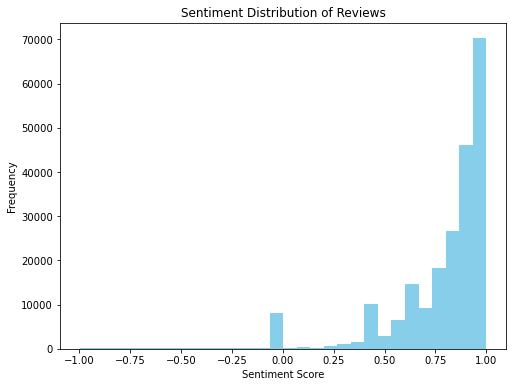

In [24]:
import matplotlib.pyplot as plt

# Plotting sentiment distribution
plt.figure(figsize=(8, 6))
plt.hist(data['sentiment_score'], bins=30, color='skyblue')
plt.title('Sentiment Distribution of Reviews')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()


In [25]:
clean_reviews

['staying mei lin ross butterfly inn delightful house lovely natural light skylight wonderfully warm welcoming place mei lin especially kind loving fouryearold particularly loved helping feed bunny greatly appreciated location perfect near everything could walk many place including university downtown farmer s market whole food pool mei lin even walked u show u  hp garage  way farmer s market also great able use kitchen thank mei lin ross everything',
 'stayed mei lin ross conference attended stanford university warm welcome kindness made pleasent stay house helped lot allowed use kitchen internet rent one bike house close campus downtown palo alto caltrain station convinient since nt car br thank much everything mei lin ross',
 'wonderful place stay wonderful people including fun conversation englebart future history digital culture great location everyone else said leafy small town neighborhood super close stanford caltrain downtown palo alto would definitely stay',
 'convenient easy

In [26]:
len(clean_reviews)

219068

In [27]:
s = ""
for i in range(len(clean_reviews)):
    s = s+clean_reviews[i]

In [28]:
from wordcloud import WordCloud
from PIL import Image

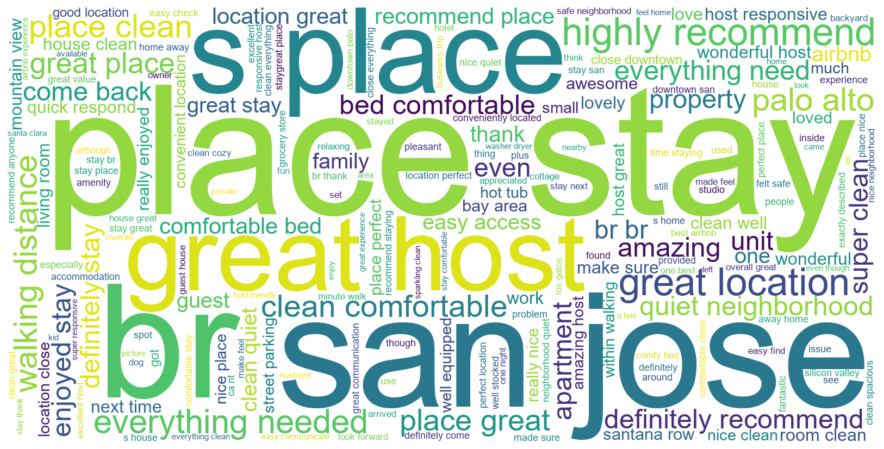

In [29]:
# Create a WordCloud object with the font path specified
wordcloud = WordCloud(width=1600, height=800,font_path= './arial.ttf',background_color='white').generate(s)

# Display the generated image:
plt.figure(figsize=(16, 8))  # Adjust figsize according to the desired aspect ratio
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Review ratings

In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219068 entries, 0 to 219067
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   listing_id       219068 non-null  int64  
 1   id               219068 non-null  int64  
 2   date             219068 non-null  object 
 3   reviewer_id      219068 non-null  int64  
 4   reviewer_name    219067 non-null  object 
 5   comments         219014 non-null  object 
 6   sentiment_score  219068 non-null  float64
dtypes: float64(1), int64(3), object(3)
memory usage: 11.7+ MB


In [31]:
sm = data['sentiment_score']

In [32]:
# rating out of 5
rating = []
for i in range(len(sm)):
    if(sm[i]<0):
        rating.append(0)
    if(sm[i]>=0 and sm[i]<0.2):
        rating.append(1)
    if(sm[i]>=0.2 and sm[i]<0.4):
        rating.append(2)
    if(sm[i]>=0.4 and sm[i]<0.6):
        rating.append(3)
    if(sm[i]>=0.6 and sm[i]<0.8):
        rating.append(4)
    if(sm[i]>=0.8 and sm[i]<=1):
        rating.append(5)

In [33]:
rating

[5,
 5,
 5,
 2,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 4,
 5,
 1,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 2,
 5,
 5,
 5,
 1,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 1,
 5,
 4,
 5,
 4,
 5,
 4,
 5,
 5,
 3,
 5,
 4,
 5,
 4,
 3,
 5,
 5,
 5,
 4,
 1,
 5,
 4,
 5,
 3,
 5,
 5,
 4,
 4,
 4,
 5,
 4,
 5,
 5,
 3,
 4,
 4,
 3,
 5,
 5,
 3,
 3,
 5,
 4,
 4,
 5,
 4,
 5,
 4,
 5,
 5,
 5,
 5,
 4,
 5,
 5,
 5,
 5,
 4,
 5,
 5,
 4,
 1,
 5,
 5,
 5,
 3,
 5,
 5,
 5,
 5,
 5,
 5,
 4,
 5,
 5,
 5,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 1,
 5,
 5,
 5,
 4,
 5,
 5,
 5,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 1,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 1,
 5,
 5,
 5,
 5,
 4,
 4,
 5,
 5,
 5,
 5,
 4,
 5,
 5,
 4,
 3,
 5,
 5,
 5,
 1,
 5,
 5,
 5,
 3,
 4,
 5,
 5,
 5,
 4,
 5,
 5,
 5,
 5,


In [34]:
data['sementic'] = sm

In [35]:
data['rating'] = rating

In [36]:
data = data.drop('sentiment_score', axis=1)

In [37]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219068 entries, 0 to 219067
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   listing_id     219068 non-null  int64  
 1   id             219068 non-null  int64  
 2   date           219068 non-null  object 
 3   reviewer_id    219068 non-null  int64  
 4   reviewer_name  219067 non-null  object 
 5   comments       219014 non-null  object 
 6   sementic       219068 non-null  float64
 7   rating         219068 non-null  int64  
dtypes: float64(1), int64(4), object(3)
memory usage: 13.4+ MB


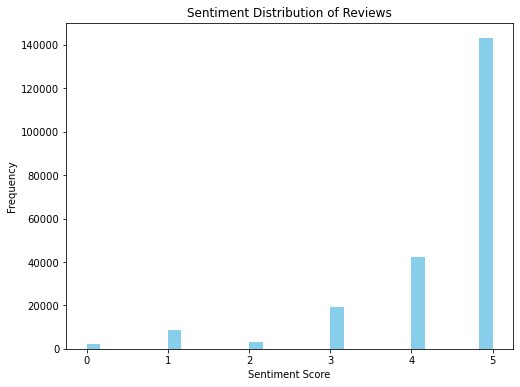

In [38]:
import matplotlib.pyplot as plt

# Plotting sentiment distribution
plt.figure(figsize=(8, 6))
plt.hist(data['rating'], bins=30, color='skyblue')
plt.title('Sentiment Distribution of Reviews')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()

In [39]:
import pandas as pd

# Assuming data is your NumPy array
data_series = pd.Series(data['rating'])
counts = data_series.value_counts()
counts

5    143096
4     42206
3     19411
1      8810
2      3206
0      2339
Name: rating, dtype: int64

# Data Visualization

In [40]:
listing  = pd.read_csv('cleaned_listing.csv')

In [41]:
data.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,sementic,rating
0,4952,6560,2009-08-02,25672,Diane,Staying with Mei Lin and Ross at the Butterfly...,0.9934,5
1,4952,8953,2009-09-04,27901,Michaela,I stayed with Mei Lin and Ross during a confer...,0.8555,5
2,4952,13779,2009-10-16,33939,Mark,What a wonderful place to stay. Wonderful peop...,0.9698,5
3,4952,19790,2009-12-10,55537,David,"Convenient & easy-going, which is what I needed.",0.3182,2
4,4952,51096,2010-06-08,131240,SiNae,"Warm and friendly folks, very helpful! Very co...",0.9260,5


In [42]:
review = data

In [43]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

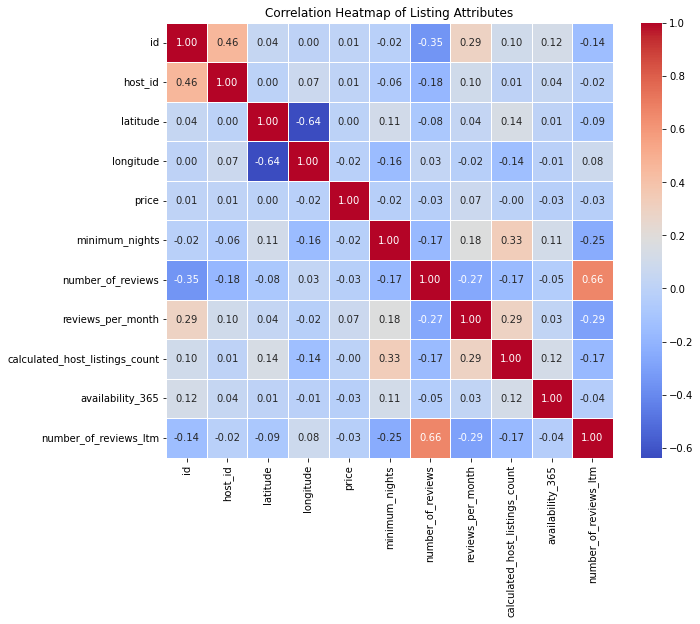

In [44]:
# Calculate correlation matrix
correlation_matrix = listing.corr()

# Plot a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Listing Attributes')
plt.show()

In [45]:
import plotly.express as px
# Group by room_type and calculate the average price
avg_price_by_room = listing.groupby('room_type')['price'].mean().reset_index()

# Create a bar chart using Plotly Express
fig = px.bar(avg_price_by_room, x='room_type', y='price', color='room_type',
             title='Average Price by Room Type',
             labels={'room_type': 'Room Type', 'price': 'Average Price'},
             template='plotly_dark')

# Show the plot
fig.show()

In [46]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

In [47]:
# Create a base map
m = folium.Map(location=[listing['latitude'].mean(), listing['longitude'].mean()], zoom_start=5)

# Create a MarkerCluster
marker_cluster = MarkerCluster().add_to(m)

# Add markers to the map
for index, row in listing.iterrows():
    folium.Marker([row['latitude'], row['longitude']],
                  popup=f"Price: ${row['price']}",
                  icon=None).add_to(marker_cluster)

# Save the map as an HTML file
m.save('listing_map.html')

In [48]:
m

# Predicting the rating from the review 

In [68]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

In [69]:
def get_user_review():
    review = input("Enter your review: ")
    return review

In [75]:
def analyze_sentiment(review):
    rating = 0
    sid = SentimentIntensityAnalyzer()
    sentiment_scores = sid.polarity_scores(review)
    compound_score = sentiment_scores['compound']
    if compound_score >= 0.05:
        return 5
    elif compound_score > -0.05 and compound_score < 0.05:
        return 3
    else:
        return 1

In [77]:
def main():
    user_review = get_user_review()
    predicted_rating = analyze_sentiment(user_review)

    print(f"Predicted Rating: {predicted_rating}")

if __name__ == "__main__":
    main()


Enter your review: bad room and hygiene not maintain 
Predicted Rating: 1
